## Wild Parrot Observations in Los Angeles County  
For this week's assignment I will be creating a map showcasing the locations of wild parrot sightings (including 39 different species of parrots) across the County of Los Angeles. To accomplish this, I am utilizing a data set sourced from the Moore Lab of Zoology's Free-Flying Los Angeles Parrot Project (FLAPP) on iNaturalist, an application that consolidates user submitted data regarding wildlife observations. This includes information such as species, research grade, and location, among other factors.

In [71]:
# import two code libraries into the notebook.
import pandas as pd
import geopandas as gpd

In [72]:
# import shapefile containing data on parrot observations into the notebook.
parrot = gpd.read_file('data/parrot-observations')

In [73]:
# retrieve metadata regarding the imported data
parrot.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 3093 entries, 0 to 3092
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   id          3093 non-null   int64         
 1   observed_o  3093 non-null   datetime64[ms]
 2   time_obser  3045 non-null   object        
 3   quality_gr  3093 non-null   object        
 4   descriptio  519 non-null    object        
 5   latitude    3093 non-null   float64       
 6   longitude   3093 non-null   float64       
 7   positional  2414 non-null   float64       
 8   place_town  119 non-null    object        
 9   scientific  3093 non-null   object        
 10  common_nam  3093 non-null   object        
 11  geometry    3093 non-null   geometry      
dtypes: datetime64[ms](1), float64(3), geometry(1), int64(1), object(6)
memory usage: 290.1+ KB


In [74]:
# display the first five rows of the imported data
parrot.head()

,id,observed_o,time_obser,quality_gr,descriptio,latitude,longitude,positional,place_town,scientific,common_nam,geometry
0,12691,2011-03-06,None,research,These are wild parrots that live in Malibu. Th...,34.099751,-118.725042,NaN,None,Aratinga nenday,Nanday Parakeet,POINT (4835978.594 1598348.917)
1,325235,2013-03-09,2013/03/10 00:00:00.000,research,These parrots were seen and photographed by Je...,34.017992,-118.419812,NaN,None,Psittacara mitratus,Mitred Parakeet,POINT (4835978.69 1598348.932)
2,366436,2013-08-15,None,research,Some of the invasive parrots that I've encount...,34.037202,-118.745742,1639.0,None,Aratinga nenday,Nanday Parakeet,POINT (4835978.596 1598348.897)
3,393890,2013-03-09,2013/03/10 00:00:00.000,research,These parrots were seen and photographed by Je...,34.017992,-118.419812,3170.0,None,Psittacara mitratus,Mitred Parakeet,POINT (4835978.69 1598348.932)
4,448366,2013-04-22,None,research,These parrots were in our backyard. They kept ...,33.969073,-118.026100,462.0,None,Amazona autumnalis,Red-lored Amazon,POINT (4835978.806 1598348.966)


In [76]:
# display the number of times each parrot species has been observed
parrot['scientific'].value_counts()

scientific
Amazona viridigenalis                         2158
Amazona                                        291
Amazona finschi                                279
Amazona oratrix                                200
Amazona autumnalis                              54
Psittacara mitratus                             21
Aratinga nenday                                 14
Amazona finschi × viridigenalis                 14
Brotogeris chiriri                               8
Amazona ochrocephala                             7
Psittacara erythrogenys                          7
Psittacara                                       5
Astur cooperii                                   3
Vidua macroura                                   3
Amazona viridigenalis × oratrix                  2
Melanerpes formicivorus                          2
Psittacula krameri                               2
Sturnus vulgaris                                 2
Pionus maximiliani                               1
Melopsittacus undula

<Axes: >

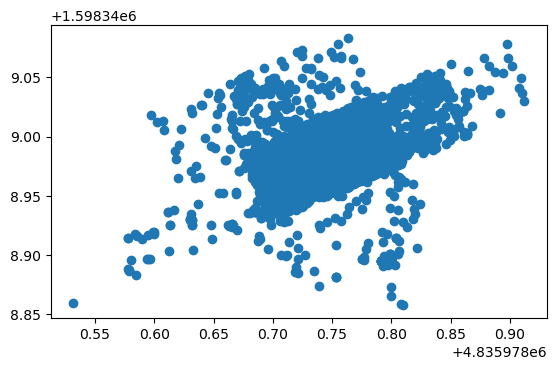

In [77]:
# create a preliminary plot of where parrots have been observed
parrot.plot()

<Axes: >

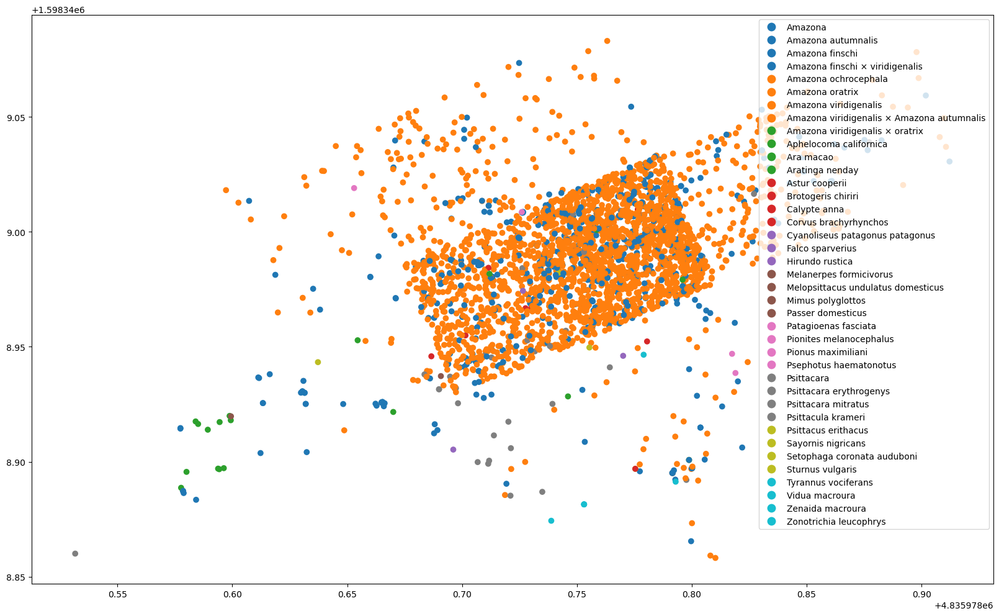

In [78]:
# create a cleaned-up plot of parrot locations 
parrot.plot(
            figsize=(20,20),   
            column = 'scientific',   
            legend = True,     
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  
) 

### Making a Nicer Looking Plot  
As can be seen by the second plot shown above, given the fact that there are 39 separate species of parrots that have been recorded by FLAPP in Los Angeles County, there are no where near enough colors to correctly sort them all by color. 

Thus, in an attempt to make the plot more readable, I will be attempting to consolidate together species of the same genus into one color coded category. For example, 9 different species/hybrids of the genus *Amazona* were recorded by FLAPP, and thus could be merged into a singular category: "Amazona (genus)" instead. 

In [79]:
# replace instances of "Amazona" in the scientific column with "Amazona (genus)"
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Amazona (genus)' if 'Amazona' in x else x)

# display a list of all variables to test for efficacy
parrot['scientific'].value_counts()

scientific
Amazona (genus)                       3006
Psittacara mitratus                     21
Aratinga nenday                         14
Brotogeris chiriri                       8
Psittacara erythrogenys                  7
Psittacara                               5
Astur cooperii                           3
Vidua macroura                           3
Melanerpes formicivorus                  2
Sturnus vulgaris                         2
Psittacula krameri                       2
Corvus brachyrhynchos                    1
Zenaida macroura                         1
Pionus maximiliani                       1
Hirundo rustica                          1
Passer domesticus                        1
Melopsittacus undulatus domesticus       1
Zonotrichia leucophrys                   1
Mimus polyglottos                        1
Cyanoliseus patagonus patagonus          1
Sayornis nigricans                       1
Setophaga coronata auduboni              1
Pionites melanocephalus                  1


In [80]:
# replace instances of "Psittacara" in the scientific column with "Psittacara (genus)"
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Psittacara (genus)' if 'Psittacara' in x else x)

# display a list of all variables to test for efficacy
parrot['scientific'].value_counts()

scientific
Amazona (genus)                       3006
Psittacara (genus)                      33
Aratinga nenday                         14
Brotogeris chiriri                       8
Astur cooperii                           3
Vidua macroura                           3
Melanerpes formicivorus                  2
Sturnus vulgaris                         2
Psittacula krameri                       2
Corvus brachyrhynchos                    1
Zenaida macroura                         1
Pionus maximiliani                       1
Hirundo rustica                          1
Passer domesticus                        1
Melopsittacus undulatus domesticus       1
Zonotrichia leucophrys                   1
Mimus polyglottos                        1
Cyanoliseus patagonus patagonus          1
Sayornis nigricans                       1
Setophaga coronata auduboni              1
Pionites melanocephalus                  1
Tyrannus vociferans                      1
Aphelocoma californica                   1


<Axes: >

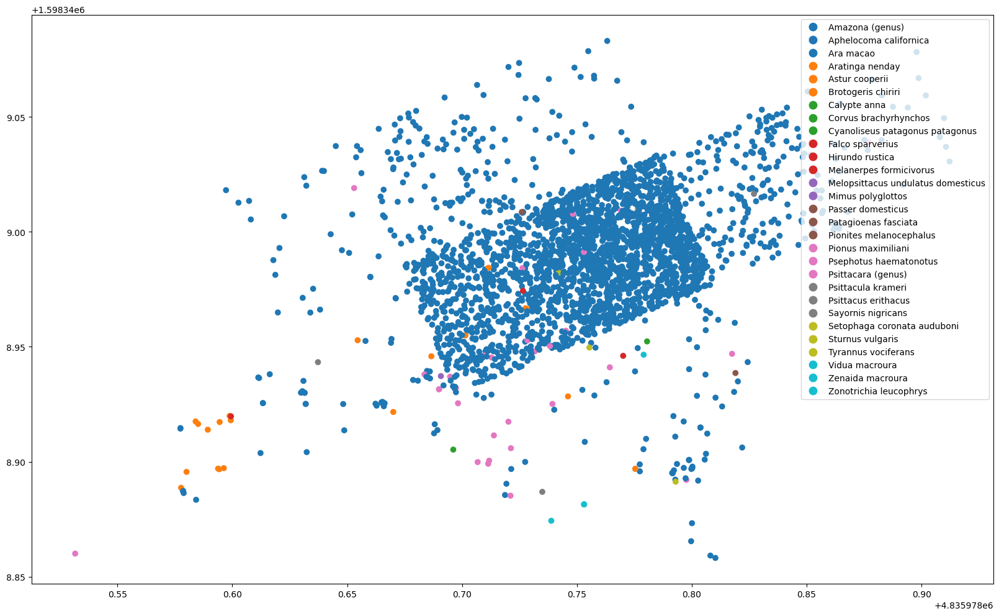

In [81]:
# create a plot with the two combined genera
parrot.plot(
            figsize=(20,20),   
            column = 'scientific',   
            legend = True,     
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  
) 

As can be seen through the above plot, combining together species of the same genus helped to simplify the number of variables within the scientific column by a great deal, decreasing the count from 39 to 29. It also helps to visually display that the vast majority of parrot sightings in Los Angeles County are members of the genus *Amazona*, given the high presence of blue on the plot. However, it is still obvious that there are still too many individual species to match the number of colors available. Even if a folium to display the data, there are only 19 available colors, 10 less than the current number of variables.

Thus, I will be trying to consolidate members of the various species that only had one invidual observed into a single variable called "Other."

In [82]:
# replace instances of "Psittacara" in the scientific column with "Psittacara (genus)"
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Corvus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Zenaida' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Pionus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Hirundo' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'domesticus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Zonotrichia' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Mimus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Cyanoliseus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Sayornis' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Setophaga' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Pionites' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Tyrannus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Aphelocoma' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Patagioenas' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Psittacus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Psephotus' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Calypte' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Ara macao' in x else x)
parrot['scientific'] = parrot['scientific'].apply(lambda x: 'Other' if 'Falco' in x else x)

# display a list of all variables to test for efficacy
parrot['scientific'].value_counts()

scientific
Amazona (genus)            3006
Psittacara (genus)           33
Other                        20
Aratinga nenday              14
Brotogeris chiriri            8
Astur cooperii                3
Vidua macroura                3
Psittacula krameri            2
Melanerpes formicivorus       2
Sturnus vulgaris              2
Name: count, dtype: int64

<Axes: >

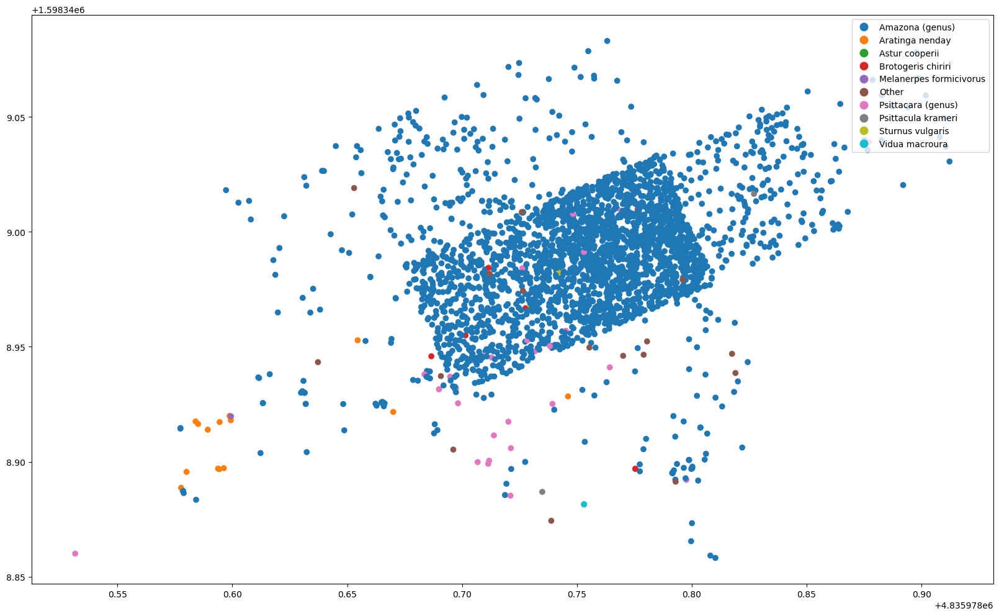

In [83]:
# create a new plot containing the combined "Other" variable
parrot.plot(
            figsize=(20,20),   
            column = 'scientific',   
            legend = True,     
            legend_kwds={
               'loc': 'upper right',
               'bbox_to_anchor':(1,1)
            }                  
) 

As can be seen in the new plot above, the data has been simplified significantly and each of the remaining variables has been provided with its own color, making it much easier for a viewer to understand the information being provided. 

The method that I used to achieve this is admittedly a rather inelegant solution, given the fact that I had to individually go in and replace each singular variable in the scientific column with the new "Other" variable. I'm sure that there some way to accomplish this through one line of code using some form of loop or if the code I used above could pull from the count provided by the .value_counts command.

### Creating a Folium Map 
With the data now simplified down to 10 variables in the scientific column, I will try to create an actual map, which shows the location of parrot observations on an actual reference map of Los Angeles County.

In [85]:
# import the needed code for creating folium maps
import folium
import xyzservices.providers as xyz

In [86]:
# exchange the base map of the folium map with one provided by OpenStreetMap
m = folium.Map(location=[latitude,longitude], tiles='Cartodb Positron', zoom_start=10, attr="Map data © OpenStreetMap contributors")

In [87]:
# find the average latitude of all parrot observations
latitude = parrot.latitude.mean()
print(latitude)

34.10657643006304


In [88]:
# find the average longitude of all parrot observations
longitude = parrot.longitude.mean()
print(longitude)

-118.1607751517111


In [89]:
# display the new folium map to check for efficacy
m

In [90]:
# use a forloop to assign each entry to a folium map marker
for index, row in parrot.iterrows():
    folium.Marker([row.latitude, row.longitude], popup=row.scientific, tooltip=row.scientific).add_to(m)

I would otherwise display the folium map using "m" at this point, however, after attempting to do so multiple times, the notebook slows down signficiantly and it becomes hard to continue working on the assignment. However, I did manage to load it in and confirm that the observation points are correctly displayed on the folium map.

As such, to ensure the operation of the notebook, I will only include the final folium map that includes color coded points.

In [92]:
# add a new column that will contain corresponding marker color
parrot['color'] = ''
# display the list of variables in the scientific column for easier transfer in the next step
parrot['scientific'].value_counts()

scientific
Amazona (genus)            3006
Psittacara (genus)           33
Other                        20
Aratinga nenday              14
Brotogeris chiriri            8
Astur cooperii                3
Vidua macroura                3
Psittacula krameri            2
Melanerpes formicivorus       2
Sturnus vulgaris              2
Name: count, dtype: int64

In [93]:
# assign color values to the newly created column based on each value in the scientific column
parrot.loc[parrot['scientific'] == 'Amazona (genus)', 'color'] = 'green'
parrot.loc[parrot['scientific'] == 'Psittacara (genus)', 'color'] = 'red'
parrot.loc[parrot['scientific'] == 'Other', 'color'] = 'blue'
parrot.loc[parrot['scientific'] == 'Aratinga nenday', 'color'] = 'purple'
parrot.loc[parrot['scientific'] == 'Brotogeris chiriri', 'color'] = 'orange'
parrot.loc[parrot['scientific'] == 'Astur cooperii', 'color'] = 'lightgreen'
parrot.loc[parrot['scientific'] == 'Vidua macroura', 'color'] = 'pink'
parrot.loc[parrot['scientific'] == 'Psittacula krameri', 'color'] = 'beige'
parrot.loc[parrot['scientific'] == 'Melanerpes formicivorus', 'color'] = 'lightgray'
parrot.loc[parrot['scientific'] == 'Sturnus vulgaris', 'color'] = 'darkpurple'

In [64]:
# get a sample of the data located in the parrot table in order to test if the above assignments worked
parrot.sample(10)

,id,observed_o,time_obser,quality_gr,descriptio,latitude,longitude,positional,place_town,scientific,common_nam,geometry,color
1748,124071870,2022-06-29,2022/06/30 02:41:00.000,research,None,34.192087,-118.199075,213.0,None,Amazona (genus),Red-crowned Amazon,POINT (4835978.731 1598349.007),green
1915,142052210,2022-11-14,2022/11/15 00:30:00.000,research,None,34.190566,-118.137585,213.0,None,Amazona (genus),Red-crowned Amazon,POINT (4835978.748 1598349.014),green
1050,57798303,2020-08-27,2020/08/28 01:44:00.000,research,None,34.145760,-117.995199,2.0,None,Amazona (genus),Red-crowned Amazon,POINT (4835978.793 1598349.019),green
1268,80823926,2021-05-21,2021/05/21 14:37:00.000,research,None,34.149520,-118.210447,31.0,None,Amazona (genus),Red-crowned Amazon,POINT (4835978.733 1598348.994),green
1819,133720036,2022-09-04,2022/09/05 01:56:00.000,research,None,34.129678,-118.127184,213.0,None,Amazona (genus),Lilac-crowned Amazon,POINT (4835978.758 1598348.998),green
1177,73359752,2021-04-08,2021/04/08 23:18:00.000,research,"These birds were being quiet, but we noticed f...",34.128781,-118.242251,60.0,Glendale,Psittacara (genus),Mitred Parakeet,POINT (4835978.726 1598348.984),red
1078,63601148,2020-10-21,2020/10/21 23:05:46.000,research,Sorry about the quality of the photos. Tried t...,34.325960,-118.325601,5.0,None,Amazona (genus),Red-crowned Amazon,POINT (4835978.679 1598349.029),green
538,19773748,2019-01-20,2019/01/21 00:35:00.000,research,None,33.819594,-118.100066,185.0,None,Amazona (genus),Lilac-crowned Amazon,POINT (4835978.804 1598348.915),green
288,9763305,2018-02-07,2018/02/07 16:33:24.000,research,None,34.126686,-118.209987,NaN,Eagle Rock,Amazona (genus),Lilac-crowned Amazon,POINT (4835978.736 1598348.988),green
2546,199758817,2024-02-16,2024/02/16 15:30:00.000,research,None,34.138497,-118.114044,9.0,None,Amazona (genus),Red-crowned Amazon,POINT (4835978.761 1598349.003),green


In [67]:
# add the colored markers to the map
for index, row in parrot.iterrows():
    tooltip_text = ' Species: ' + row.scientific
    folium.Marker(
        [row.latitude,row.longitude], 
        popup=row.scientific, 
        tooltip=tooltip_text,
        icon=folium.Icon(color=row.color)
    ).add_to(m)

In [69]:
# display the map
m

In [95]:
# save the map to an html file
m.save('parrot.html')